In [6]:
import numpy as np
import pandas as pd
import os, time
import pickle, gzip
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
from sklearn import preprocessing as pp
from scipy.stats import pearsonr
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import log_loss
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.metrics import confusion_matrix, classification_report

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
import lightgbm as lgb


In [11]:
current_path = os.getcwd()
file = '\\data\\mnist.pkl.gz'
f = gzip.open(current_path+file, 'rb')
train_set, validation_set, test_set = pickle.load(f, encoding='latin1')
f.close()

X_train, y_train = train_set[0], train_set[1]
X_validation, y_validation = validation_set[0], validation_set[1]
X_test, y_test = test_set[0], test_set[1]

In [12]:
print('shape of X_train', X_train.shape)
print('shape of y_train', y_train.shape)
print('shape of X_validation', X_validation.shape)
print('shape of y_validation', y_validation.shape)
print('shape of X_test', X_test.shape)
print('shape of y_test', y_test.shape)

shape of X_train (50000, 784)
shape of y_train (50000,)
shape of X_validation (10000, 784)
shape of y_validation (10000,)
shape of X_test (10000, 784)
shape of y_test (10000,)


## PCA implementaiton

In [16]:
from sklearn.decomposition import PCA
n_components = 784
whiten = False
random_state = 42
pca = PCA(n_components, whiten=whiten, random_state=random_state)
X_train_PCA = pca.fit_transform(X_train)
X_train_PCA = pd.DataFrame(data=X_train_PCA)

In [33]:
X_train_PCA.head()
y_train = pd.DataFrame(data=y_train)
type(y_train)


pandas.core.frame.DataFrame

In [18]:
print('variance explained by all 784 principal components', sum(pca.explained_variance_ratio_))

variance explained by all 784 principal components 1.000000022065862


In [29]:

importanceOfPricipalComponents = pd.DataFrame(pca.explained_variance_ratio_)
importanceOfPricipalComponentsT = importanceOfPricipalComponents.T
print('variance explained by first 10 principal components')
print(importanceOfPricipalComponentsT.loc[:,0:9].sum(axis=1).values)
print('variance explained by first 20 principal components')
print(importanceOfPricipalComponentsT.loc[:,0:19].sum(axis=1).values)
print('variance explained by first 100 principal components')
print(importanceOfPricipalComponentsT.loc[:,0:99].sum(axis=1).values)

variance explained by first 10 principal components
[0.48876238]
variance explained by first 20 principal components
[0.6439802]
variance explained by first 100 principal components
[0.9146586]


In [30]:
def scatterPlot(xDF, yDF, algoName):
    tempDF = pd.DataFrame(data=xDF.loc[:,0:1], index=xDF.index)
    tempDF = pd.concat((tempDF,yDF), axis=1, join='inner')
    tempDF.columns = ['First Vector', 'Second Vector', 'Label']
    sns.lmplot(x='First Vector', y='Second Vector', hue='Label', data=tempDF, fit_reg=False)
    ax = plt.gca()
    ax.set_title('Seperation of Observations using' + algoName)

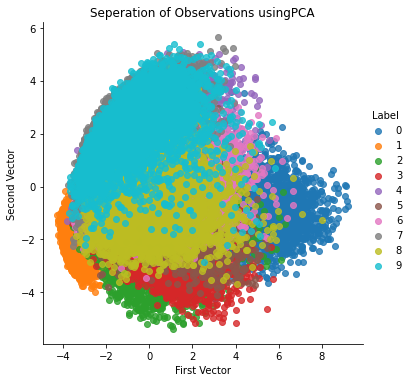

In [34]:
scatterPlot(X_train_PCA, y_train, "PCA")

## isomap implementation

In [44]:
from sklearn.manifold import Isomap

n_neighbors = 5
n_components = 10
n_jobs = 4

X_train = pd.DataFrame(data=X_train)
type(X_train)

isomap = Isomap(n_neighbors=n_neighbors, n_components=n_components, n_jobs=n_jobs)
isomap.fit(X_train.loc[0:5000,:])
X_train_isomap = isomap.transform(X_train)
X_train_isomap = pd.DataFrame(data=X_train_isomap)

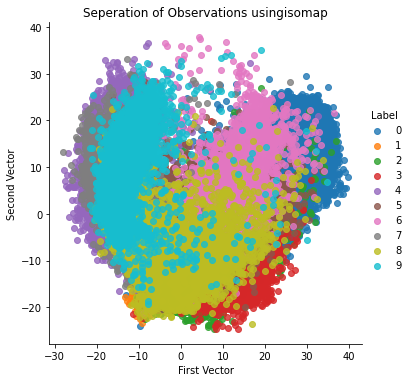

In [45]:
scatterPlot(X_train_isomap, y_train, "isomap")

## t-SNE implementation

In [49]:
from sklearn.manifold import TSNE

n_components = 2
learning_rate = 300
perplexity = 30
early_exaggeration = 12
init = 'random'
random_state = 42

tSNE = TSNE(n_components=n_components, learning_rate=learning_rate, perplexity=perplexity, early_exaggeration=early_exaggeration, init=init, random_state=random_state)

X_train_tSNE = tSNE.fit_transform(X_train_PCA.loc[:5000,:9])
X_train_tSNE = pd.DataFrame(data=X_train_tSNE)


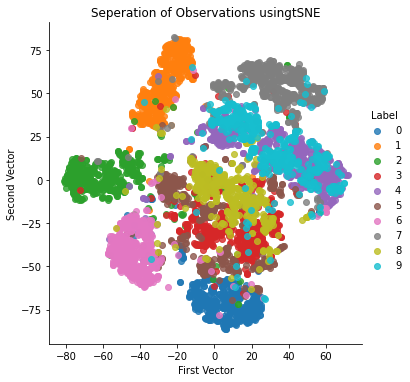

In [50]:
scatterPlot(X_train_tSNE, y_train, "tSNE")